<a href="https://colab.research.google.com/github/anshika3112/Emotion-Detection-using-facial-expression/blob/main/code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##  Emotion Detection through Facial Expression

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)



cuda


In [ ]:
from google import colab
import tensorflow as tf
import tensorflow_hub as hub

print("TF version : ",tf.__version__)
print("TF hub version: ",hub.__version__)

# Check for GPU availability
print("GPU","available(Nimce!!!!)" if tf.config.list_physical_devices("GPU") else "not available: ()")

TF version :  2.14.0
TF hub version:  0.15.0
GPU available(Nimce!!!!)


## Getting our data ready (turning into Tensors)
With all ML models, our data has to be in numerical format. So that's the first task ,turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels

In [ ]:
#Checkout the labels of our data

import pandas as pd

labels_csv = pd.read_csv("/content/drive/MyDrive/Facial_expression/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())


         Unnamed: 0        relFCs
count  28175.000000  28175.000000
mean   14087.000000      0.799247
std     8133.566253      0.058755
min        0.000000      0.516357
25%     7043.500000      0.766363
50%    14087.000000      0.809000
75%    21130.500000      0.842068
max    28174.000000      0.899951
   Unnamed: 0                     pth     label    relFCs
0           0  anger/image0000006.jpg  surprise  0.873142
1           1  anger/image0000060.jpg     anger  0.852311
2           2  anger/image0000061.jpg     anger  0.800957
3           3  anger/image0000066.jpg   disgust  0.843079
4           4  anger/image0000106.jpg     anger  0.849108


In [ ]:
labels_csv.head()

,Unnamed: 0,pth,label,relFCs
0,0,anger/image0000006.jpg,surprise,0.873142
1,1,anger/image0000060.jpg,anger,0.852311
2,2,anger/image0000061.jpg,anger,0.800957
3,3,anger/image0000066.jpg,disgust,0.843079
4,4,anger/image0000106.jpg,anger,0.849108


In [ ]:
labels_csv["pth"][0]

'anger/image0000006.jpg'

<Axes: >

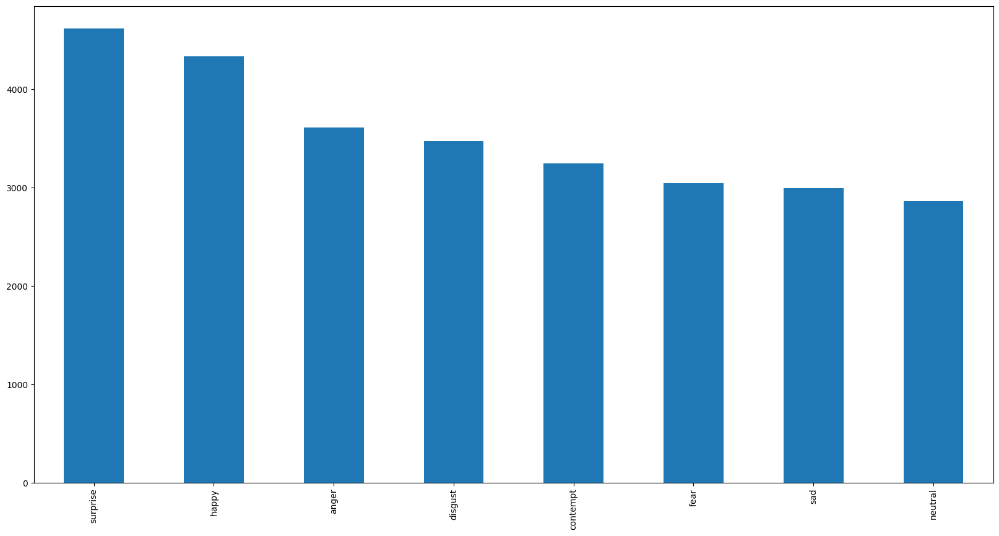

In [ ]:
# How many images are there of each expression?

labels_csv["label"].value_counts().plot.bar(figsize= (20,10))

In [ ]:
labels_csv["label"].value_counts().median()

3358.0

In [ ]:
len(labels_csv)

28175

In [ ]:
labels_csv.head()

,Unnamed: 0,pth,label,relFCs
0,0,anger/image0000006.jpg,surprise,0.873142
1,1,anger/image0000060.jpg,anger,0.852311
2,2,anger/image0000061.jpg,anger,0.800957
3,3,anger/image0000066.jpg,disgust,0.843079
4,4,anger/image0000106.jpg,anger,0.849108


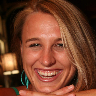

In [ ]:
# Let's view an image

from IPython.display import Image
Image("/content/drive/MyDrive/Facial_expression/train/happy/ffhq_0.png")

In [ ]:
len(labels_csv)

28175

In [ ]:

labels_csv.head()

,Unnamed: 0,pth,label,relFCs
0,0,anger/image0000006.jpg,surprise,0.873142
1,1,anger/image0000060.jpg,anger,0.852311
2,2,anger/image0000061.jpg,anger,0.800957
3,3,anger/image0000066.jpg,disgust,0.843079
4,4,anger/image0000106.jpg,anger,0.849108


In [ ]:
labels_csv.loc[0,"label"]

'surprise'

In [ ]:
labels_csv.head()

,Unnamed: 0,pth,label,relFCs
0,0,anger/image0000006.jpg,surprise,0.873142
1,1,anger/image0000060.jpg,anger,0.852311
2,2,anger/image0000061.jpg,anger,0.800957
3,3,anger/image0000066.jpg,disgust,0.843079
4,4,anger/image0000106.jpg,anger,0.849108


<Axes: >

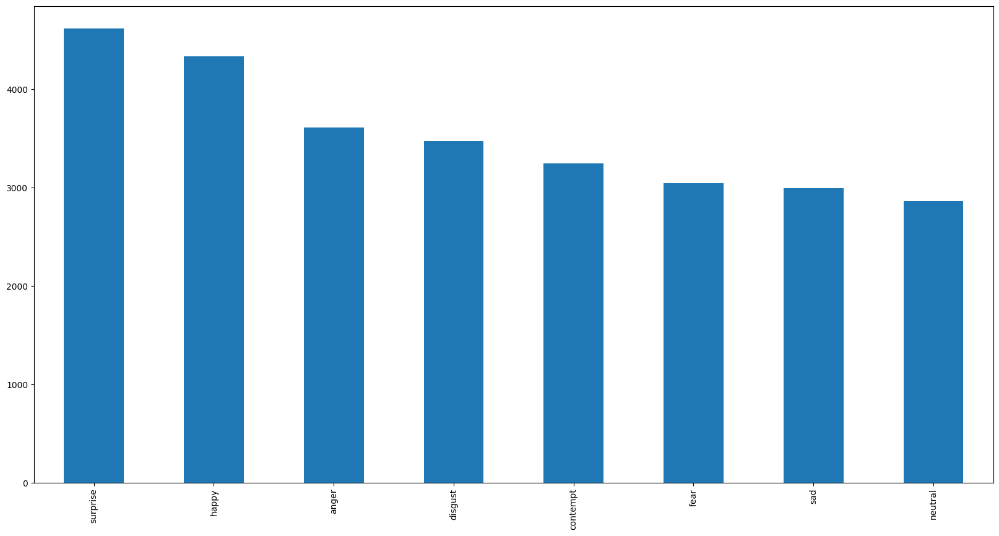

In [ ]:
# How many images are there of each expression?

labels_csv["label"].value_counts().plot.bar(figsize= (20,10))

In [ ]:
# Create pathnames from image labels

filenames = ["/content/drive/MyDrive/Facial_expression/train/" + fname  for fname in labels_csv["pth"]]

filenames[:10]

['/content/drive/MyDrive/Facial_expression/train/anger/image0000006.jpg',
 '/content/drive/MyDrive/Facial_expression/train/anger/image0000060.jpg',
 '/content/drive/MyDrive/Facial_expression/train/anger/image0000061.jpg',
 '/content/drive/MyDrive/Facial_expression/train/anger/image0000066.jpg',
 '/content/drive/MyDrive/Facial_expression/train/anger/image0000106.jpg',
 '/content/drive/MyDrive/Facial_expression/train/anger/image0000132.jpg',
 '/content/drive/MyDrive/Facial_expression/train/anger/image0000138.jpg',
 '/content/drive/MyDrive/Facial_expression/train/anger/image0000182.jpg',
 '/content/drive/MyDrive/Facial_expression/train/anger/image0000195.jpg',
 '/content/drive/MyDrive/Facial_expression/train/anger/image0000213.jpg']

In [ ]:
len(filenames)


28175

In [ ]:
filenames[7000]

'/content/drive/MyDrive/Facial_expression/train/disgust/image0037068.jpg'

In [ ]:
import os

anger= len(os.listdir("/content/drive/MyDrive/Facial_expression/train/anger"))
contempt= len(os.listdir("/content/drive/MyDrive/Facial_expression/train/contempt"))
disgust= len(os.listdir("/content/drive/MyDrive/Facial_expression/train/disgust"))
fear= len(os.listdir("/content/drive/MyDrive/Facial_expression/train/fear"))
happy=len(os.listdir("/content/drive/MyDrive/Facial_expression/train/happy"))
neutral= len(os.listdir("/content/drive/MyDrive/Facial_expression/train/neutral"))
sad= len(os.listdir("/content/drive/MyDrive/Facial_expression/train/sad"))
surprise= len(os.listdir("/content/drive/MyDrive/Facial_expression/train/surprise"))

print(f"anger:  {anger}")
print(f"contempt:  {contempt}")
print(f"disgust:  {disgust}")
print(f"fear:  {fear}")
print(f"happy:  {happy}")
print(f"neutral:  {neutral}")
print(f"sad:  {sad}")
print(f"surprise:  {surprise}")

sum= anger+contempt+disgust+fear+happy+neutral+sad+surprise

sum

anger:  3238
contempt:  2881
disgust:  2487
fear:  3186
happy:  5064
neutral:  5132
sad:  3111
surprise:  4061


29160

In [ ]:
anger=0
contempt=0
disgust=0
fear=0
happy=0
neutral=0
sad=0
surprise=0


for p in labels_csv["pth"]:
  if  p[:5]=="anger":
    anger+=1
  elif  p[:8]=="contempt":
    contempt+=1
  elif  p[:7]=="disgust":
    disgust+=1
  elif  p[:4]=="fear":
    fear+=1
  elif  p[:5]=="happy":
    happy+=1
  elif  p[:7]=="neutral":
    neutral+=1
  elif  p[:3]=="sad":
    sad+=1
  elif  p[:8]=="surprise":
    surprise+=1

print(f"anger:  {anger}")
print(f"contempt:  {contempt}")
print(f"disgust:  {disgust}")
print(f"fear:  {fear}")
print(f"happy:  {happy}")
print(f"neutral:  {neutral}")
print(f"sad:  {sad}")
print(f"surprise:  {surprise}")

sum= anger+contempt+disgust+fear+happy+neutral+sad+surprise

sum

anger:  3034
contempt:  2757
disgust:  2377
fear:  2979
happy:  5043
neutral:  5114
sad:  2934
surprise:  3937


28175

In [ ]:
labels_csv["pth"][3033]

'anger/image0030763.jpg'

In [ ]:
filenames[3034]

'/content/drive/MyDrive/Facial_expression/train/contempt/ffhq_1.png'

In [ ]:
filenames[3035]

'/content/drive/MyDrive/Facial_expression/train/contempt/ffhq_10.png'

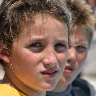

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/Facial_expression/train/contempt/ffhq_10.png")

In [ ]:
filenames[11146]

'/content/drive/MyDrive/Facial_expression/train/fear/image0040960.jpg'

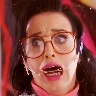

In [ ]:

from IPython.display import Image
Image("/content/drive/MyDrive/Facial_expression/train/fear/image0040960.jpg")


In [ ]:
filenames[11147]

'/content/drive/MyDrive/Facial_expression/train/happy/ffhq_0.png'

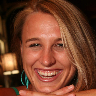

In [ ]:

from IPython.display import Image
Image("/content/drive/MyDrive/Facial_expression/train/happy/ffhq_0.png")


In [ ]:
filenames[16189]

'/content/drive/MyDrive/Facial_expression/train/happy/image1000008.jpg'

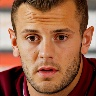

In [ ]:
Image(filenames[21906])

In [ ]:
filenames[16190]

'/content/drive/MyDrive/Facial_expression/train/neutral/ffhq_0.png'

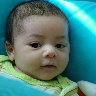

In [ ]:
Image(filenames[16190])

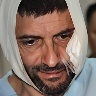

In [ ]:
Image(filenames[5020])

In [ ]:
labels_csv.tail()

,Unnamed: 0,pth,label,relFCs
28170,28170,surprise/image0034960.jpg,surprise,0.825263
28171,28171,surprise/image0034961.jpg,surprise,0.738646
28172,28172,surprise/image0034966.jpg,surprise,0.774524
28173,28173,surprise/image0034973.jpg,neutral,0.766952
28174,28174,surprise/image0042075.jpg,disgust,0.832160


In [ ]:
import numpy as np
labels = labels_csv["label"].to_numpy()
#labels = np.array(labels)
labels

array(['surprise', 'anger', 'anger', ..., 'surprise', 'neutral',
       'disgust'], dtype=object)

In [ ]:
len(labels)

28175

In [ ]:
# Find the Unique labels
unique_labels = np.unique(labels)
unique_labels

array(['anger', 'contempt', 'disgust', 'fear', 'happy', 'neutral', 'sad',
       'surprise'], dtype=object)

In [ ]:
len(unique_labels)

8

In [ ]:
print(labels[0])
labels[0]==unique_labels

surprise


array([False, False, False, False, False, False, False,  True])

In [ ]:
#Turn every label into a boolean array
boolean_labels = [l == unique_labels for l in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False,  True]),
 array([ True, False, False, False, False, False, False, False])]

In [ ]:
len(boolean_labels)

28175

In [ ]:
# Example turing boolean array into integers
print(labels[0]) #original label
print(np.where(unique_labels== labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs

surprise
(array([7]),)
7
[0 0 0 0 0 0 0 1]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

anger
[1 0 0 0 0 0 0 0]


## Creating our own validation set
Since Kaggle dataset doesn't come with a validation set, so there is a need to create our own.

In [ ]:
# Setup X and y variables
X = filenames
y= boolean_labels

In [ ]:
len(y)

28175

In [ ]:
len(X)

28175

## Start off experimentation with 1k images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES  = 1000 #@param{type:"slider", min: 1000, max:10000, step :1000}

In [ ]:
# Split our data into validation and train
from sklearn.model_selection import train_test_split

#Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val= train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES],
                                                 test_size=0.2, random_state=42)
len(X_train,), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
#Lets have a look at the training data
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Facial_expression/train/anger/image0000602.jpg',
  '/content/drive/MyDrive/Facial_expression/train/anger/image0010707.jpg',
  '/content/drive/MyDrive/Facial_expression/train/anger/image0013193.jpg',
  '/content/drive/MyDrive/Facial_expression/train/anger/image0011100.jpg',
  '/content/drive/MyDrive/Facial_expression/train/anger/image0015006.jpg'],
 [array([ True, False, False, False, False, False, False, False]),
  array([ True, False, False, False, False, False, False, False])])

##Preprocessing Images(turning images into Tensors)
To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the image to a shape of (224, 224)
6. Return the modified image

Note : Check "TensorFlow Data Loading" for more

Before we do, lets see what importing an image looks like.

In [ ]:
#Convert an image into a  Numpy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(96, 96, 3)

In [ ]:
image

array([[[179, 197, 135],
        [182, 200, 138],
        [184, 202, 140],
        ...,
        [156, 167, 125],
        [158, 165, 123],
        [164, 171, 129]],

       [[186, 204, 142],
        [189, 207, 145],
        [189, 207, 145],
        ...,
        [160, 171, 128],
        [159, 166, 124],
        [157, 164, 120]],

       [[193, 209, 147],
        [195, 211, 149],
        [195, 211, 149],
        ...,
        [159, 171, 125],
        [162, 169, 125],
        [155, 163, 116]],

       ...,

       [[175, 174, 182],
        [180, 179, 187],
        [187, 185, 196],
        ...,
        [145, 140, 137],
        [182, 171, 175],
        [238, 227, 231]],

       [[178, 177, 185],
        [183, 182, 190],
        [189, 187, 198],
        ...,
        [154, 149, 145],
        [160, 150, 148],
        [200, 189, 187]],

       [[177, 176, 184],
        [185, 184, 192],
        [193, 191, 202],
        ...,
        [172, 165, 159],
        [165, 156, 149],
        [170, 159, 153]]

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
#converting into tensors
tf.constant(image)[:2] # has the advantage of gpu over numpy making it faster for computation

<tf.Tensor: shape=(2, 96, 3), dtype=uint8, numpy=
array([[[179, 197, 135],
        [182, 200, 138],
        [184, 202, 140],
        [182, 200, 138],
        [181, 199, 139],
        [182, 200, 140],
        [183, 201, 143],
        [183, 201, 143],
        [182, 200, 142],
        [182, 200, 142],
        [181, 198, 143],
        [180, 197, 142],
        [180, 194, 141],
        [178, 192, 139],
        [177, 191, 138],
        [175, 192, 138],
        [178, 194, 145],
        [176, 194, 144],
        [177, 193, 146],
        [177, 193, 146],
        [179, 192, 149],
        [177, 190, 146],
        [178, 190, 140],
        [179, 191, 143],
        [177, 185, 144],
        [179, 187, 148],
        [183, 192, 149],
        [174, 184, 134],
        [179, 192, 138],
        [177, 188, 145],
        [170, 176, 164],
        [223, 227, 236],
        [203, 208, 228],
        [ 91,  97, 123],
        [193, 201, 224],
        [142, 150, 173],
        [180, 188, 209],
        [126, 134, 155],


In [ ]:
# Define image size
IMG_SIZE=224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Take an image path and turns the image into a Tensor.
  """
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 colour channels(Red, Green, Blue)
  image= tf.image.decode_jpeg(image,channels=3)

  #Convert the colour channel values from 0-255 to 0-1 values (Normalization)
  image = tf.image.convert_image_dtype(image,tf.float32)

  #Resize the image to our desired value(224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


In [ ]:
# yann lecun batch size/ jeremy howard batch size @ twitter


##Turning our data into batches
Why to turn data into batches?

IF you're trying to fit say 10k+ images in one go, then it's a possibility that they all might not fit into memory.

So, that's why, should opt for 32(batch size) images at a time (which is manually adjustable).

For effective use of TensorFlow, we need our data in the form of Tensor tuples: '(images, label)'

In [ ]:
# Create a simple function to return a tuple(image,label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, processes the image
  and returns a tuple of (image,label)
  """
  image = process_image(image_path)
  return image,label

In [ ]:
(process_image(filenames[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.69803923, 0.7725491 , 0.52156866],
         [0.6997199 , 0.77422976, 0.5232493 ],
         [0.7047619 , 0.7792718 , 0.52829134],
         ...,
         [0.63137263, 0.6588236 , 0.49411774],
         [0.6431374 , 0.6705884 , 0.5058825 ],
         [0.64705884, 0.6745098 , 0.50980395]],
 
        [[0.7019608 , 0.77647066, 0.5254902 ],
         [0.7036415 , 0.77815133, 0.5271709 ],
         [0.7086835 , 0.78319335, 0.5322129 ],
         ...,
         [0.63033223, 0.6577832 , 0.4925971 ],
         [0.6399361 , 0.66738707, 0.5017208 ],
         [0.6431373 , 0.67058825, 0.50476193]],
 
        [[0.7137255 , 0.78823537, 0.5372549 ],
         [0.7154062 , 0.78991604, 0.5389356 ],
         [0.7204482 , 0.79495806, 0.5439776 ],
         ...,
         [0.6272109 , 0.6546619 , 0.48803526],
         [0.6303322 , 0.65778315, 0.48923573],
         [0.6313726 , 0.65882355, 0.48963588]],
 
        ...,
 
        [[0.692437  , 0.6885154 

Now we've got a way to turn our data into tuples of Tensors in the form: (image, label). Let's make a function to make all of our data (x & y) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE= 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size= BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but does'nt shuffle if it's validation
  data.
  Also accepts test data as input(no labels).
  """

  #If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches....")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepaths (no labels)
    data_batch= data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #if the data is a valid dataset , we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                              tf.constant(y)))  #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Create training data batches....")
    #Turn filepaths and labels into Tensors
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    #Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    #Create(image,label) tuple(this also turns the image path into a preprocessed image)
    data= data.map(get_image_label)

    #Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch



In [ ]:
#Create training and validation data batches
train_data =  create_data_batches(X_train, y_train)
val_data= create_data_batches(X_val, y_val, valid_data= True)

Create training data batches....
Creating validation data batches....


In [ ]:
#Checkout the diff attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 8), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 8), dtype=tf.bool, name=None)))

##Visualizing Data Batches
Our data is now in batches, however , these can be a little hard to understand/comprehend.

In [ ]:
import matplotlib.pyplot as plt

#Create a function for viewing images in a data batch
def show_25_images (images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots(5 rows, 5 cols)
    ax= plt.subplot(5, 5, i+1)
  # Display an image
    plt.imshow(images[i])
    plt.title(unique_labels[labels[i].argmax()])

    #turn the gridlines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.09411766, 0.08627451, 0.09019608],
          [0.09355743, 0.08459384, 0.08739496],
          [0.09187675, 0.07955182, 0.0789916 ],
          ...,
          [0.06666667, 0.0509804 , 0.14117648],
          [0.06666667, 0.0509804 , 0.14117648],
          [0.06666667, 0.0509804 , 0.14117648]],
 
         [[0.09859945, 0.08963586, 0.09355742],
          [0.09779913, 0.08787515, 0.09067627],
          [0.09539817, 0.08259304, 0.08203281],
          ...,
          [0.06666667, 0.0512205 , 0.14093637],
          [0.06666667, 0.05146059, 0.14069629],
          [0.06666667, 0.05154062, 0.14061625]],
 
         [[0.11204483, 0.0997199 , 0.10364147],
          [0.11052421, 0.0977191 , 0.10052022],
          [0.10596239, 0.09171669, 0.09115647],
          ...,
          [0.06666667, 0.05194078, 0.14021608],
          [0.06666667, 0.05290117, 0.1392557 ],
          [0.06666667, 0.05322129, 0.13893558]],
 
         ...,
 
         [[0.62353086, 0.45602423, 0.43697655],
          [0.60656

In [ ]:
len(train_images) , len(train_labels)

(32, 32)

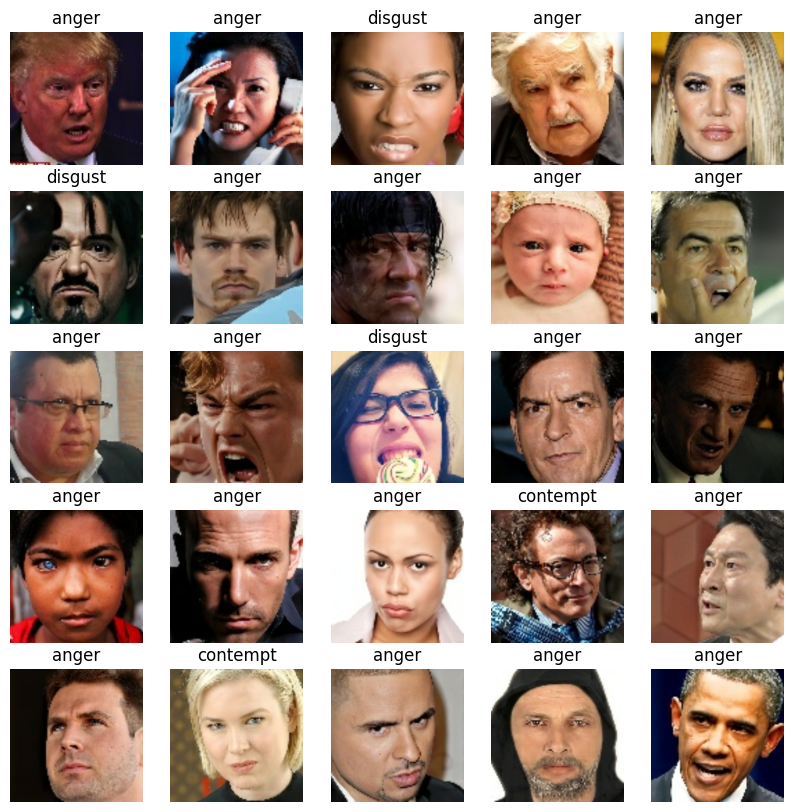

In [ ]:
# Let's visualize the data in a training batch
show_25_images(train_images, train_labels)

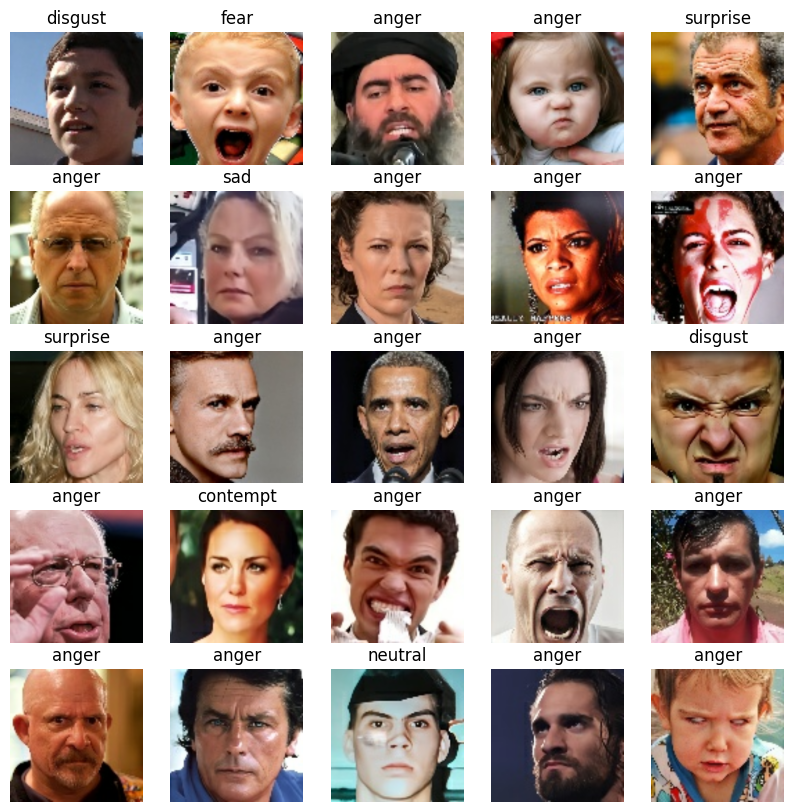

In [ ]:
# Now lets visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:

1. The input shape (our image shape, in the form of Tensors ) to our model.

2. The output shape(image labels, in the form of Tensors ) of our model.

3. The URL of the model we want to use is from TensorFlow Hub- https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
val_labels


array([[False, False,  True, False, False, False, False, False],
       [False, False, False,  True, False, False, False, False],
       [ True, False, False, False, False, False, False, False],
       [ True, False, False, False, False, False, False, False],
       [False, False, False, False, False, False, False,  True],
       [ True, False, False, False, False, False, False, False],
       [False, False, False, False, False, False,  True, False],
       [ True, False, False, False, False, False, False, False],
       [ True, False, False, False, False, False, False, False],
       [ True, False, False, False, False, False, False, False],
       [False, False, False, False, False, False, False,  True],
       [ True, False, False, False, False, False, False, False],
       [ True, False, False, False, False, False, False, False],
       [ True, False, False, False, False, False, False, False],
       [False, False,  True, False, False, False, False, False],
       [ True, False, Fal

In [ ]:
# Setup input shape to the model

INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height , width, color channels

#Setup output shape of our model
OUTPUT_SHAPE = len(unique_labels)

#Setup model URL from TensorFlow
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we've got our inputs , outputs and model ready to go .
Let's put them together into Keras deep learning model!

Knowing this, lets create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.

* Defines the layer in a Keras model in sequential fashion(do this first, then this, then that)

* Compiles the model (says it should be evaluated and improved).

* Builds the model (tell the model the input shape it'll be getting).

* Returns the model.

All these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
#Create a function which builds a keras model
def create_model(input_shape= INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  #Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
      activation="softmax") #layer 2 (output layer)
  ])

  #Compile the model
  model.compile(
      loss= tf.keras.losses.CategoricalCrossentropy(),
      optimizer= tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model= create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 8)                 8016      
                                                                 
Total params: 5440729 (20.75 MB)
Trainable params: 8016 (31.31 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating  callbacks

Callbacks are helper functions a model use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).


In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
import os

#Create a function to build a TensorBoard callback

def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir= os.path.join("/content/drive/MyDrive/Facial_expression/logs",
                       #Make it , so the logs get tracked whenever we run an experiment
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)



## Early stopping callback

Prevents model from overlearning over the provided dataset , which could otherwise lead to the problem of not generalizing the test(other) dataset.

Early stopping helps us to stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping (monitor="val_accuracy",
                                                   patience=3)

## Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 # @param {type: "slider", min:10, max:100, step: 10}


In [ ]:
# Check to make sure the prescence of GPU
print("GPU", "available (Nimce!!!)" if tf.config.list_physical_devices("GPU") else "Not available")



GPU available (Nimce!!!)


Let's create a function which trains a model.

* Create a model using 'create_model()'
* Setup a TensorBoard callback using ' create _tensorboard_callback()'
* Call the fit() function on our model passing our training and validation data, number of epochs to train for ('NUM_EPOCHS') and callbacks we'd like to use.
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #Create a model
  model= create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x= train_data,
            epochs= NUM_EPOCHS,
            validation_data= val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # return the fitted model
  return model



In [ ]:
# Fit the model to the data
model= train_model() # first epoch takes comparatively more time than others as initialization/loading of data in the memomry takes place in the first phase

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 104s 4s/step - loss: 1.5816 - accuracy: 0.5625 - val_loss: 1.4783 - val_accuracy: 0.6850
Epoch 2/100
25/25 [==============================] - 2s 80ms/step - loss: 1.2513 - accuracy: 0.6300 - val_loss: 1.3538 - val_accuracy: 0.6500
Epoch 3/100
25/25 [==============================] - 2s 79ms/step - loss: 1.1174 - accuracy: 0.6425 - val_loss: 1.3900 - val_accuracy: 0.6850
Epoch 4/100
25/25 [==============================] - 2s 87ms/step - loss: 1.0186 - accuracy: 0.6513 - val_loss: 1.3652 - val_accuracy: 0.6250


## Checking the TensorBoard logs
The TensorBoard magic function ('%tensorboard') will access the logs directory we created earlier and visualize its contents

In [ ]:
#for training dataset
%tensorboard --logdir /content/drive/MyDrive/Facial_expression/logs --port 8000


<IPython.core.display.Javascript object>

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 8), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on validation data (not used to train on)
predictions = model.predict(val_data, verbose=1 )
predictions

7/7 [==============================] - 38s 54ms/step


array([[0.3954892 , 0.06282855, 0.27539912, ..., 0.07920283, 0.06971326,
        0.01018936],
       [0.754238  , 0.00571946, 0.04947171, ..., 0.00163554, 0.00739093,
        0.03164252],
       [0.3388999 , 0.17644359, 0.08808143, ..., 0.16811827, 0.01272658,
        0.03628236],
       ...,
       [0.6875022 , 0.02617342, 0.16684453, ..., 0.07529774, 0.01551202,
        0.02445424],
       [0.9593483 , 0.00166776, 0.0047342 , ..., 0.00197444, 0.0261304 ,
        0.00307567],
       [0.7005269 , 0.02694397, 0.10077623, ..., 0.0432149 , 0.01345415,
        0.00531359]], dtype=float32)

In [ ]:
predictions.shape

(200, 8)

In [ ]:
len(y_val)

200

In [ ]:
predictions[0]

array([0.3954892 , 0.06282855, 0.27539912, 0.10630431, 0.0008734 ,
       0.07920283, 0.06971326, 0.01018936], dtype=float32)

In [ ]:
len(predictions[0])

8

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index=0
print(predictions[0])
print(f"Max value (probability of prediction) : {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_labels[np.argmax(predictions[index])]}")


[0.3954892  0.06282855 0.27539912 0.10630431 0.0008734  0.07920283
 0.06971326 0.01018936]
Max value (probability of prediction) : 0.3954891860485077
Sum: 1.0
Max index: 0
Predicted label: anger


In [ ]:
unique_labels

array(['anger', 'contempt', 'disgust', 'fear', 'happy', 'neutral', 'sad',
       'surprise'], dtype=object)

Having the above functionality is great but we want to be able to do so it at scale.

And it would be even better if we could see the image the prediction is being made on.else

**NOTE**: Prediction probabilities are also known as confidence levels.


In [ ]:
#Turn prediction probabilities into their respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """

  return unique_labels[np.argmax(prediction_probabilities)]


#Get a predicted label based on an array of prediction probabilities
#pred_label= get_pred_label(predictions[81])
#pred_label

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 8), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a

def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays
  of images and labels.
  """

  images= []
  labels= []
  #Loop through unbatched data
  for image , label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
#val_images, val_labels = unbatchify(val_data)
#val_images[0], val_labels[0]

In [ ]:
get_pred_label(val_labels[0])

'disgust'

In [ ]:
images_= []
labels_=[]
#Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.454902  , 0.5921569 , 0.7568628 ],
         [0.45658267, 0.59383756, 0.7585435 ],
         [0.46162468, 0.5988796 , 0.7635855 ],
         ...,
         [0.467227  , 0.6268909 , 0.79103667],
         [0.4873952 , 0.65378183, 0.8212889 ],
         [0.49411768, 0.6627451 , 0.8313726 ]],
 
        [[0.4577031 , 0.594958  , 0.75966394],
         [0.45922372, 0.59647864, 0.7611846 ],
         [0.46378556, 0.6010404 , 0.76574636],
         ...,
         [0.46330544, 0.6216888 , 0.7840739 ],
         [0.48179293, 0.6461788 , 0.8124053 ],
         [0.4879552 , 0.65434176, 0.8218488 ]],
 
        [[0.46610647, 0.60336137, 0.7680673 ],
         [0.4671469 , 0.60440177, 0.7691077 ],
         [0.47026813, 0.607523  , 0.77222896],
         ...,
         [0.4515407 , 0.60608256, 0.76318544],
         [0.46498618, 0.6233696 , 0.7857546 ],
         [0.46946782, 0.6291317 , 0.7932774 ]],
 
        ...,
 
        [[0.38599443, 0.38207287, 0.4016807 ],
         [0.38519412, 0.38127255, 0.40088

In [ ]:
get_pred_label(labels_[0])

'disgust'

In [ ]:
get_pred_label(predictions[0])

'anger'


Now we've got ways to get:
* Prediction labels
* Validation labels(truth labels)
* Validation images

Let's make some function to make these all a bit more visualize

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n):
  """
  view the prediction, ground truth and image for sample n
  """
  pred_prob, image= prediction_probabilities[n], images[n]
  true_label = unique_labels[labels[n].argmax()]
  #Get the pred label
  pred_label = get_pred_label(pred_prob)

  #Plot image and remove the ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the colour of the title depending on if the prediction is right or wrong
  # print(pred_label)
  # print(true_label)
  # print(labels[n])
  if pred_label== true_label:
    color= "green"
  else:
    color= "red"

  #Change the plot title to be predicted, probability of prediction an truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color= color)




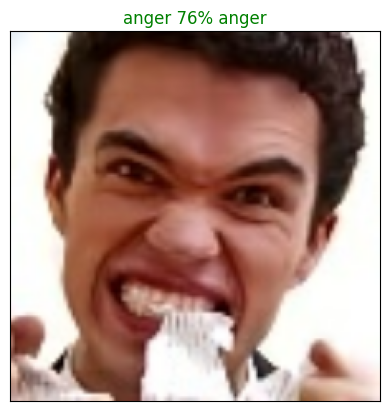

In [ ]:
plot_pred(prediction_probabilities= predictions,
          labels= val_labels,
          images= val_images,
          n=17);

From tensorflow.python.eager.backprop import indexed_slices
Now we've got one function to visualize our models top prediction, Let's make another to view our models top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an np.integer
* Find the prediction using 'get_pred_label()'
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top prediction probabilities values and labels, coloring the true label green
  

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label= prediction_probabilities[n], unique_labels[labels[n].argmax()]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes= pred_prob.argsort()[-10:][::-1]

  #Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #Find the top 10 prediction labels
  top_10_pred_labels= unique_labels[top_10_pred_indexes]

  #Setup plot
  top_plot= plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values, color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels= top_10_pred_labels, rotation="vertical")

  #Change the color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels== true_label)].set_color("green")






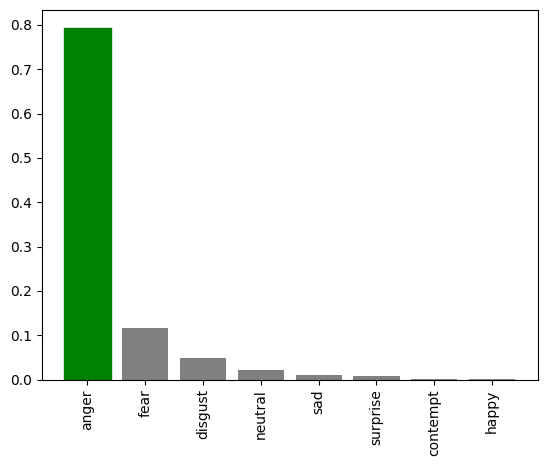

In [ ]:
plot_pred_conf(prediction_probabilities = predictions, labels=val_labels, n=9)

Now we've got some functions to help visualize our predictions and evaluate our modle, let's check out a few predictions and their different values

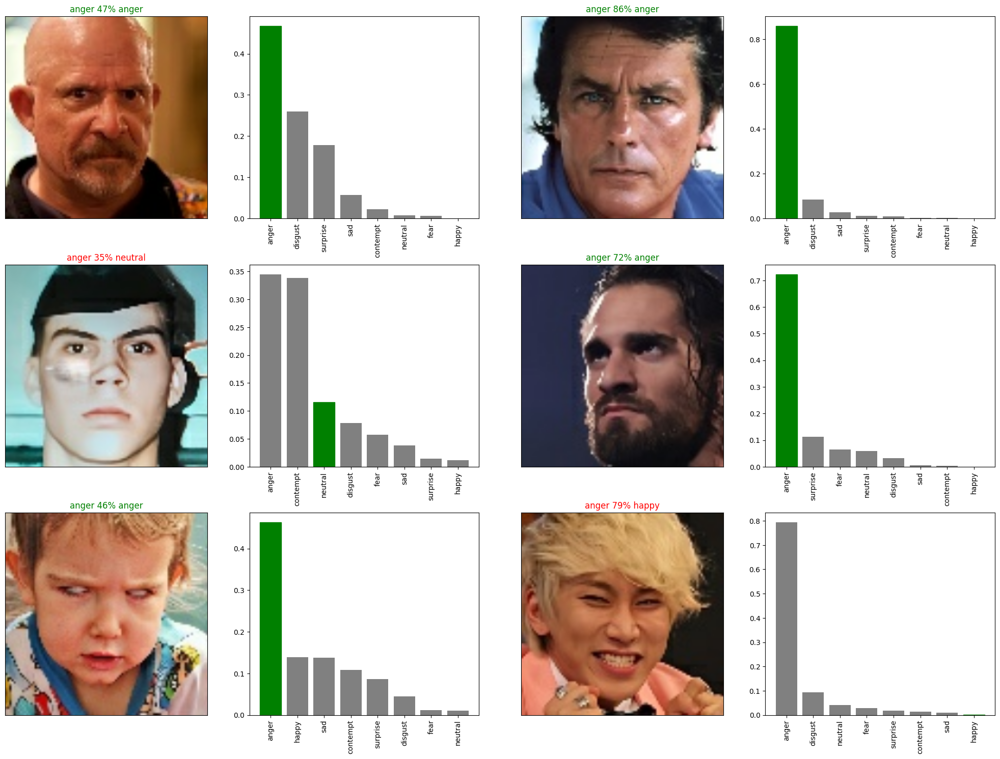

In [ ]:
i_multiplier = 20
num_rows= 3
num_cols= 2
num_images= num_rows* num_cols
plt.figure(figsize = (10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities= predictions,
            labels= val_labels,
            images= val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)

  plot_pred_conf(prediction_probabilities= predictions,
                 labels= val_labels,
                 n= i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Confusion matrix with models prediction and true labels?

Saving and reloading a training model

In [ ]:
def save_model(model, suffix= None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  #Create a model directory pathname with current file
  modeldir = os.path.join("/content/drive/MyDrive/Facial_expression/Sentiments_model",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path= modeldir +"-"+ suffix+".h5" #save format of model(like extension)
  print(f"Saving model to: {model_path}....")
  model.save(model_path)
  return model_path

In [ ]:
#Create a function to load a trained model

def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading the saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we have functions to save and load model, now test them!

In [ ]:
# Save the model trained on 1000 imaegs
save_model(model, suffix="1000-imagesSentimental_Analysis-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Facial_expression/Sentiments_model/20231128-06471701154056-1000-imagesSentimental_Analysis-mobilenetv2-Adam.h5....


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Facial_expression/Sentiments_model/20231128-06471701154056-1000-imagesSentimental_Analysis-mobilenetv2-Adam.h5'

In [ ]:
# Loading the saved trained modelA
loaded_1000_images_model= load_model("/content/drive/MyDrive/Facial_expression/Sentiments_model/20231124-10241700821468-1000-imagesSentimental_Analysis-mobilenetv2-Adam.h5")

Loading the saved model from: /content/drive/MyDrive/Facial_expression/Sentiments_model/20231124-10241700821468-1000-imagesSentimental_Analysis-mobilenetv2-Adam.h5...


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 0s 48ms/step - loss: 1.3652 - accuracy: 0.6250


[1.3651522397994995, 0.625]

In [ ]:
#Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 53ms/step - loss: 1.3751 - accuracy: 0.6450


[1.3751258850097656, 0.6449999809265137]

## Training the model (ON FULL DATA!)

In [ ]:
# Create a data batch with full data set
full_data= create_data_batches(X, y)

Create training data batches....


In [ ]:
len(X) , len(y)

(28175, 28175)

In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 8), dtype=tf.bool, name=None))>

In [ ]:
#Create a model for a full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
#Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

#No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

Note: Below cell may take a while for getting executed (approx 30 min. for first epochs) because the GPU under usage in the runtime has to load all of the data images into the memory.

In [ ]:
#Fit the full model to full data
full_model.fit(x= full_data,
               epochs= NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

In [ ]:
save_model(full_model, suffix="full-imageSentimental_Analysis-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Facial_expression/Sentiments_model/20230715-16321689438740-full-imageSentimental_Analysis-set-mobilenetv2-Adam.h5....


'/content/drive/MyDrive/Facial_expression/Sentiments_model/20230715-16321689438740-full-imageSentimental_Analysis-set-mobilenetv2-Adam.h5'

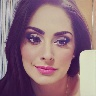

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/Facial_expression/train/contempt/image0033686.jpg")

In [ ]:
loaded_full_model= load_model("/content/drive/MyDrive/Facial_expression/Sentiments_model/20230715-16321689438740-full-imageSentimental_Analysis-set-mobilenetv2-Adam.h5")

Loading the saved model from: /content/drive/MyDrive/Facial_expression/Sentiments_model/20230715-16321689438740-full-imageSentimental_Analysis-set-mobilenetv2-Adam.h5...


## Making predictions on the custom images

To make predictions on custom images :
* Get the filepath of custom images
* Turn the filepath into data batches using 'create_data_batches'. And Since our custom images won't
  have labels, we set the 'test_data' parameter to 'True'.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get the custom image filepaths
import os
custom_path= "/content/drive/MyDrive/Facial_expression/custom_images/"
custom_image_paths= [custom_path+ fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/Facial_expression/custom_images/goldberg.jpg',
 '/content/drive/MyDrive/Facial_expression/custom_images/Hritik.jpeg',
 '/content/drive/MyDrive/Facial_expression/custom_images/cheems.png']

In [ ]:
#Turn custom images into batch datasets
custom_data= create_data_batches(custom_image_paths, test_data= True)
custom_data

Creating test data batches....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# make predictions on custom data
custom_preds= loaded_full_model.predict(custom_data)


1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(3, 8)

In [ ]:
# Get the custom image prediction labels
custom_pred_labels= [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['anger', 'sad', 'surprise']

In [ ]:
#Get custom images(our unbatchify() function won't work since there are'nt labels.. maybe we could fix this later)
custom_images= []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

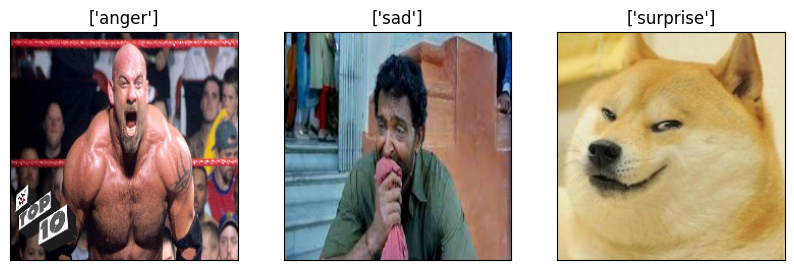

In [ ]:
#Check custom image  predictions
plt.figure(figsize= (10,10))
for i , image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title([custom_pred_labels[i]])
  plt.imshow(image)
